In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import backend as K
import math
from tensorflow.keras.layers import Layer


from tensorflow.keras import (
    layers,
    models,
    optimizers,
    utils,
    callbacks,
    metrics,
    losses,
    activations,
)
from tensorflow.keras.optimizers.schedules import CosineDecay

In [2]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  1


In [3]:
IMAGE_SIZE = 64
BATCH_SIZE = 8
LOAD_MODEL = True
NOISE_EMBEDDING_SIZE = 128
PLOT_DIFFUSION_STEPS = 20

# optimization
EMA = 0.999
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4
EPOCHS = 40

In [ ]:
# def sinusoidal_embedding(x):
#     #import tensorflow as tf
#     frequencies = tf.exp(
#         tf.linspace(
#             tf.math.log(1.0),
#             tf.math.log(1000.0),
#             NOISE_EMBEDDING_SIZE // 2,
#         )
#     )
#     angular_speeds = 2.0 * math.pi * frequencies
#     embeddings = tf.concat(
#         [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
#     )
#     return embeddings

In [4]:
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)

    return noise_rates, signal_rates

In [5]:
class GroupNorm(layers.Layer):
    def __init__(self, groups=4, epsilon=1e-5, name=None, **kwargs):
        super().__init__(name=name, **kwargs)
        self.groups = groups
        self.epsilon = epsilon

    def build(self, input_shape):
        C = input_shape[-1]
        self.G = min(self.groups, C)
        # gamma и beta для масштабирования и смещения
        self.gamma = self.add_weight(
            shape=(1, 1, 1, C),
            initializer="ones",
            trainable=True,
            name=f"{self.name}_gamma" if self.name else "gamma"
        )
        self.beta = self.add_weight(
            shape=(1, 1, 1, C),
            initializer="zeros",
            trainable=True,
            name=f"{self.name}_beta" if self.name else "beta"
        )

    def call(self, x):
        # динамически получаем размеры
        N, H, W, C = tf.shape(x)[0], tf.shape(x)[1], tf.shape(x)[2], tf.shape(x)[3]
        G = self.G
        channels_per_group = C // G

        # reshape для группировки каналов
        x_reshaped = tf.reshape(x, [N, H, W, G, channels_per_group])

        # считаем среднее и дисперсию по пространственным и групповым осям
        mean, var = tf.nn.moments(x_reshaped, axes=[1, 2, 4], keepdims=True)

        x_norm = (x_reshaped - mean) / tf.sqrt(var + self.epsilon)

        # обратно в исходную форму
        x_norm = tf.reshape(x_norm, [N, H, W, C])

        return x_norm * self.gamma + self.beta


In [6]:
def TimeEmbeddingMLP(embedding_dim, out_dim):
    dense1 = layers.Dense(embedding_dim, activation=activations.swish)
    dense2 = layers.Dense(out_dim)

    def apply(t_emb):
        x = dense1(t_emb)  # (B, embedding_dim)
        x = dense2(x)      # (B, out_dim)
        return x            # (B, out_dim)

    return apply

In [7]:
def ResNetBlock(width):
    def apply(x):
        residual = x
        x = layers.Conv2D(width, kernel_size=3, padding="same", use_bias=False)(x)
        x = GroupNorm()(x)
        x = tf.keras.layers.Activation("swish")(x)
        if residual.shape[-1] != width:
            residual = layers.Conv2D(width, kernel_size=1, padding="same", use_bias=False)(residual)
        x += residual
        return x
    return apply

In [8]:
import tensorflow as tf
from tensorflow.keras import layers

class TransformerBlock(layers.Layer):
    def __init__(self, embed_dim, num_heads, ff_dim, rate=0.0, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.ff_dim = ff_dim
        self.rate = rate

        # слои
        self.layernorm1 = layers.LayerNormalization(epsilon=1e-5)
        self.mha = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)
        self.layernorm2 = layers.LayerNormalization(epsilon=1e-5)
        self.ffn1 = layers.Dense(ff_dim, activation='swish')
        self.ffn2 = layers.Dense(embed_dim) #32

    def call(self, x):
        # динамические размеры
        B, H, W, C = tf.shape(x)[0], tf.shape(x)[1], tf.shape(x)[2], tf.shape(x)[3]

        # [B,H,W,C] -> [B, H*W, C]
        x_flat = tf.reshape(x, [B, H*W, C])
        #print(x_flat.shape)
        # LayerNorm + Self-Attention
        x_norm = self.layernorm1(x_flat)
        attn_output = self.mha(x_norm, x_norm)
        x_flat = x_flat + attn_output  # skip connection

        # Feed-forward
        ff = self.ffn1(x_flat)
        ff = self.ffn2(ff) #ff = 32, x_flat = C = tf.shape(x)[3]  = 64
        x_flat = x_flat + ff  # skip connection

        # обратно в [B,H,W,C]
        x = tf.reshape(x_flat, [B, H, W, C])
        return x

In [9]:
def DownBlock(width,time_emb):
    def apply(x):
        x, skips = x
        x = ResNetBlock(width)(x)
        x = ResNetBlock(width)(x)
        emb = TimeEmbeddingMLP(NOISE_EMBEDDING_SIZE, width)(time_emb)
        emb = layers.Reshape((1, 1, width))(emb)
        x = layers.Add()([x, emb])
        x = TransformerBlock(embed_dim=width, num_heads=4, ff_dim=4*width)(x)
        x = layers.Conv2D(width, kernel_size=3, strides=2, padding="same")(x)
        skips.append(x)
        return x
    return apply

In [10]:
def UpBlock(width,time_emb):
    def apply(x):
        x, skips = x
        x = layers.Concatenate()([x, skips.pop()])
        x = ResNetBlock(width)(x)
        x = ResNetBlock(width)(x)
        emb = TimeEmbeddingMLP(NOISE_EMBEDDING_SIZE, width)(time_emb)
        emb = layers.Reshape((1, 1, width))(emb)
        x = layers.Add()([x, emb])
        x = TransformerBlock(embed_dim=width, num_heads=4, ff_dim=4*width)(x)
        x = layers.Conv2DTranspose(filters=width,kernel_size=3,strides=2,padding="same")(x)
        return x
    return apply

In [11]:
class SinusoidalEmbedding(Layer):
    def __init__(self, embedding_dim, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim

    def call(self, x):
        half_dim = self.embedding_dim // 2
        frequencies = tf.exp(
            tf.linspace(tf.math.log(1.0), tf.math.log(1000.0), half_dim)
        )
        angular_speeds = 2.0 * math.pi * frequencies
        embeddings = tf.concat(
            [tf.sin(x * angular_speeds), tf.cos(x * angular_speeds)], axis=-1
        )
        return embeddings


In [12]:
#build flu-net
noisy_images = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 4))
x = layers.Conv2D(32, kernel_size=1)(noisy_images)
noise_variances = layers.Input(shape=(1, 1, 1))

# noise_embedding = tf.keras.layers.Lambda(
#     lambda x: tf.concat(
#         [
#             tf.sin(x * tf.reshape(tf.exp(tf.linspace(tf.math.log(1.0),
#                                                       tf.math.log(1000.0),
#                                                       NOISE_EMBEDDING_SIZE // 2)) * 2.0 * math.pi, [1,1,1,-1])),
#             tf.cos(x * tf.reshape(tf.exp(tf.linspace(tf.math.log(1.0),
#                                                       tf.math.log(1000.0),
#                                                       NOISE_EMBEDDING_SIZE // 2)) * 2.0 * math.pi, [1,1,1,-1]))
#         ],
#         axis=-1
#     ),
#     output_shape=(1, 1, NOISE_EMBEDDING_SIZE)
# )(noise_variances)

noise_embedding = SinusoidalEmbedding(NOISE_EMBEDDING_SIZE)(noise_variances)

skips = []

x = DownBlock(32, noise_embedding)((x, skips))
x = DownBlock(64, noise_embedding)((x, skips))
x = DownBlock(96, noise_embedding)((x, skips))
x = DownBlock(128, noise_embedding)((x, skips))

x = ResNetBlock(156)(x)
x = TransformerBlock(embed_dim=156, num_heads=4, ff_dim=4*156)(x)
x = ResNetBlock(156)(x)

x = UpBlock(128, noise_embedding)((x, skips))
x = UpBlock(96, noise_embedding)((x, skips))
x = UpBlock(64, noise_embedding)((x, skips))
x = UpBlock(32, noise_embedding)((x, skips))

x = layers.Conv2D(2, kernel_size=1, kernel_initializer="zeros")(x)

flu_net = models.Model([noisy_images, noise_variances], x, name="flunet")

/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'transformer_block', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'transformer_block_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'transformer_block_2', howev

In [13]:
class DiffusionModel(models.Model):
    def __init__(self):
        super().__init__()
        self.network = flu_net
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images[..., :2] - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        last_two_channels = current_images[..., -2:]

        for step in range(diffusion_steps):
            if current_images.shape[-1] < 4:
              current_images = tf.concat([current_images, last_two_channels], axis=-1)

            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            )
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            current_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
        return pred_images

    def generate(self, num_images, diffusion_steps, initial_noise=None):##
        if initial_noise is None:
            initial_noise = tf.random.normal(
                shape=(num_images, IMAGE_SIZE, IMAGE_SIZE, 4)
            )
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        )
        return generated_images

    def train_step(self, images):
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 4))

        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )

        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)

        noisy_images = tf.cast(signal_rates, tf.float32) * tf.cast(images, tf.float32) + tf.cast(noise_rates, tf.float32) * tf.cast(noises, tf.float32)

        with tf.GradientTape() as tape:
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises[..., :2], pred_noises[:, :, :, :2])  # used for training

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        )

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):#
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 4))
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises[..., :2], pred_noises[:, :, :, :2])
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [14]:
ddm = DiffusionModel()

In [ ]:
lr_schedule = CosineDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=200000,
    alpha=0.0  # минимальный LR = alpha * initial_learning_rate
)

In [ ]:
ddm.compile(
    optimizer=optimizers.AdamW(
        learning_rate=lr_schedule,
        weight_decay=WEIGHT_DECAY
    ),
    loss=losses.MeanAbsoluteError()
)

In [ ]:
ddm.summary()

Model: "diffusion_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flunet (Functional)             │ (None, 64, 64, 2)      │     4,743,570 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flunet (Functional)             │ (None, 64, 64, 2)      │     4,743,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,487,140 (36.19 MB)

 Trainable params: 9,487,140 (36.19 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls

drive  sample_data


In [ ]:
%cd /content/drive

/content/drive


In [ ]:
%cd MyDrive
!ls

/content/drive/MyDrive
 1500+autocaptions_unzipped   dataset.npy   results
 1500+autocaptions.zip	      dir	    test_dataset.npy
 checkpoint		      drive	    wojak_SDXL.safetensors
'Colab Notebooks'	      images.zip


In [ ]:
all_images = np.load("/content/drive/MyDrive/dataset.npy")
all_images = np.transpose(all_images, (0, 2, 3, 1))
train_data = tf.data.Dataset.from_tensor_slices(all_images)


In [ ]:
train_data = train_data.shuffle(40000).batch(BATCH_SIZE)  # можно указать batch_size

In [ ]:
!mkdir dir
!mkdir checkpoint
!mkdir results

mkdir: cannot create directory ‘checkpoint’: File exists


In [ ]:
def display(
    images, n=10, size=(20, 3), cmap="gray_r", as_type="float32", save_to=None
):
    """
    Displays n random images from each one of the supplied arrays.
    """
    if images.max() > 1.0:
        images = images / 255.0
    elif images.min() < 0.0:
        images = (images + 1.0) / 2.0

    plt.figure(figsize=size)
    for i in range(n):
        _ = plt.subplot(1, n, i + 1)
        plt.imshow(images[i].astype(as_type), cmap=cmap)
        plt.axis("off")

    if save_to:
        plt.savefig(save_to)
        print(f"\nSaved to {save_to}")

    plt.show()

In [ ]:
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./drive/MyDrive/checkpoint/weights.{epoch:02d}.weights.h5",  # разные файлы для каждой эпохи
    save_weights_only=True,
    save_freq="epoch",
    verbose=1
)
import os

tensorboard_callback = callbacks.TensorBoard(log_dir="./dir")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img
        self.save_path = f"results/"
    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(
            num_images=self.num_img,
            diffusion_steps=PLOT_DIFFUSION_STEPS,
        ).numpy()[..., 0]
        display(
            generated_images,
            save_to=self.save_path + f"epoch_{epoch}.png",
        )

image_generator_callback = ImageGenerator(num_img=10)



In [ ]:
ddm.build(input_shape=(None, 64, 64, 4))

Epoch 1/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.1907
Epoch 1: saving model to ./drive/MyDrive/checkpoint/weights.01.weights.h5

Saved to results/epoch_0.png


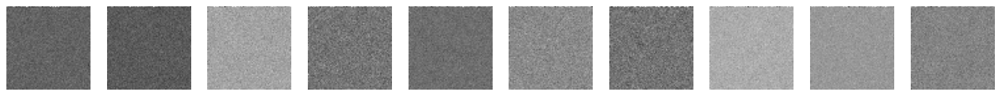

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 987s 159ms/step - n_loss: 0.1907
Epoch 2/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0623
Epoch 2: saving model to ./drive/MyDrive/checkpoint/weights.02.weights.h5

Saved to results/epoch_1.png


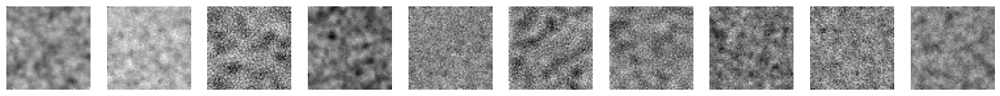

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 790s 158ms/step - n_loss: 0.0623
Epoch 3/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0554
Epoch 3: saving model to ./drive/MyDrive/checkpoint/weights.03.weights.h5

Saved to results/epoch_2.png


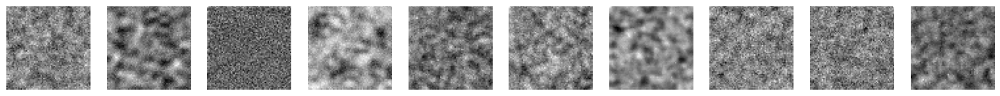

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 792s 158ms/step - n_loss: 0.0554
Epoch 4/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0535
Epoch 4: saving model to ./drive/MyDrive/checkpoint/weights.04.weights.h5

Saved to results/epoch_3.png


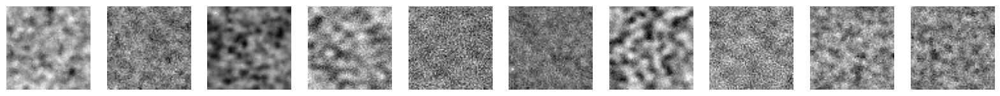

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 790s 158ms/step - n_loss: 0.0535
Epoch 5/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0519
Epoch 5: saving model to ./drive/MyDrive/checkpoint/weights.05.weights.h5

Saved to results/epoch_4.png


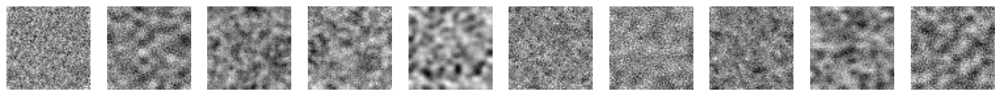

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 791s 158ms/step - n_loss: 0.0519
Epoch 6/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0512
Epoch 6: saving model to ./drive/MyDrive/checkpoint/weights.06.weights.h5

Saved to results/epoch_5.png


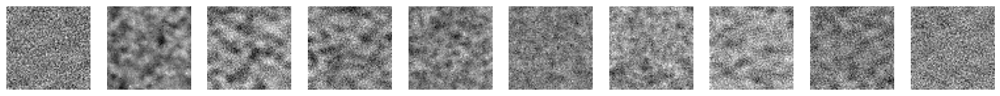

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0512
Epoch 7/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0506
Epoch 7: saving model to ./drive/MyDrive/checkpoint/weights.07.weights.h5

Saved to results/epoch_6.png


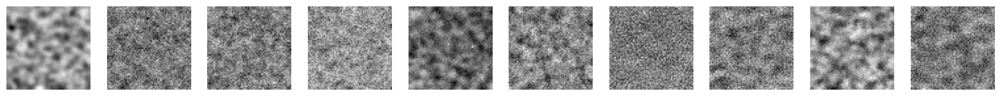

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0506
Epoch 8/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0504
Epoch 8: saving model to ./drive/MyDrive/checkpoint/weights.08.weights.h5

Saved to results/epoch_7.png


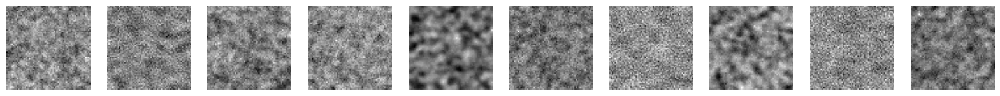

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0504
Epoch 9/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0495
Epoch 9: saving model to ./drive/MyDrive/checkpoint/weights.09.weights.h5

Saved to results/epoch_8.png


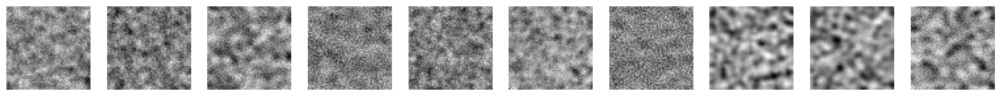

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0495
Epoch 10/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0492
Epoch 10: saving model to ./drive/MyDrive/checkpoint/weights.10.weights.h5

Saved to results/epoch_9.png


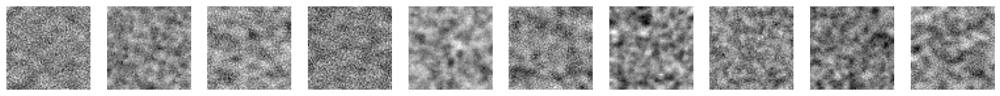

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0492
Epoch 11/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0492
Epoch 11: saving model to ./drive/MyDrive/checkpoint/weights.11.weights.h5

Saved to results/epoch_10.png


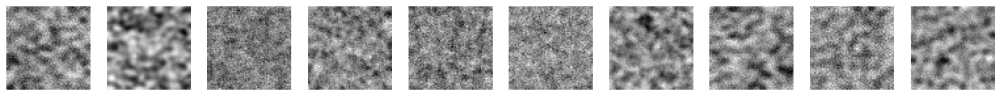

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 792s 158ms/step - n_loss: 0.0492
Epoch 12/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0484
Epoch 12: saving model to ./drive/MyDrive/checkpoint/weights.12.weights.h5

Saved to results/epoch_11.png


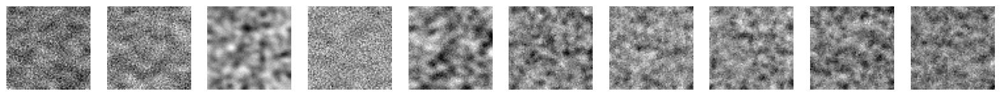

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0484
Epoch 13/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0481
Epoch 13: saving model to ./drive/MyDrive/checkpoint/weights.13.weights.h5

Saved to results/epoch_12.png


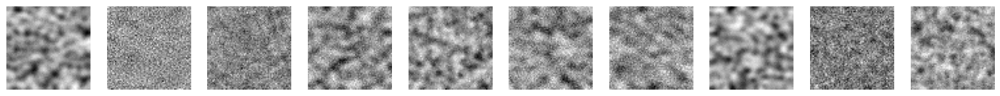

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0481
Epoch 14/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0476
Epoch 14: saving model to ./drive/MyDrive/checkpoint/weights.14.weights.h5

Saved to results/epoch_13.png


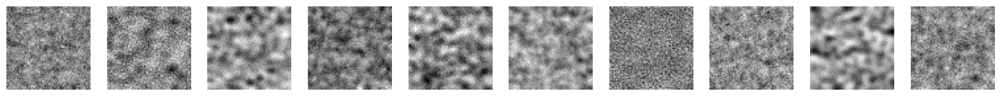

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0476
Epoch 15/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0467
Epoch 15: saving model to ./drive/MyDrive/checkpoint/weights.15.weights.h5

Saved to results/epoch_14.png


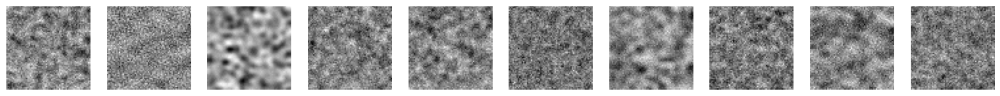

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0467
Epoch 16/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0461
Epoch 16: saving model to ./drive/MyDrive/checkpoint/weights.16.weights.h5

Saved to results/epoch_15.png


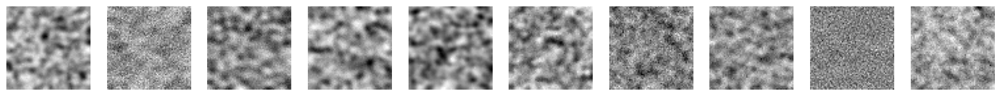

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0461
Epoch 17/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0454
Epoch 17: saving model to ./drive/MyDrive/checkpoint/weights.17.weights.h5

Saved to results/epoch_16.png


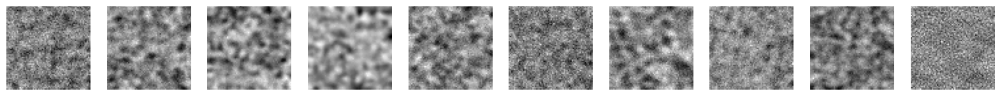

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0454
Epoch 18/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0444
Epoch 18: saving model to ./drive/MyDrive/checkpoint/weights.18.weights.h5

Saved to results/epoch_17.png


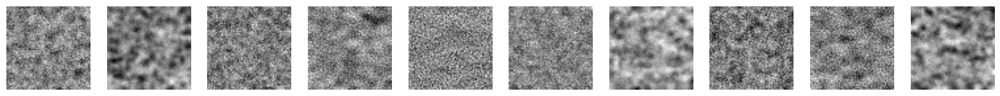

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0444
Epoch 19/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0439
Epoch 19: saving model to ./drive/MyDrive/checkpoint/weights.19.weights.h5

Saved to results/epoch_18.png


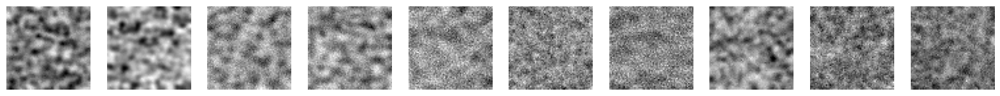

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0439
Epoch 20/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0427
Epoch 20: saving model to ./drive/MyDrive/checkpoint/weights.20.weights.h5

Saved to results/epoch_19.png


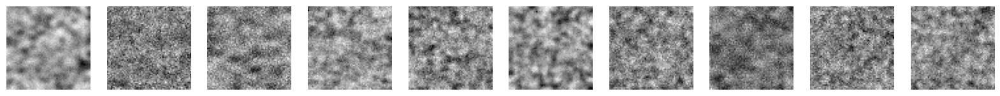

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0427
Epoch 21/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0420
Epoch 21: saving model to ./drive/MyDrive/checkpoint/weights.21.weights.h5

Saved to results/epoch_20.png


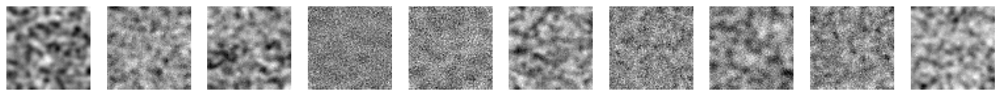

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0420
Epoch 22/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0415
Epoch 22: saving model to ./drive/MyDrive/checkpoint/weights.22.weights.h5

Saved to results/epoch_21.png


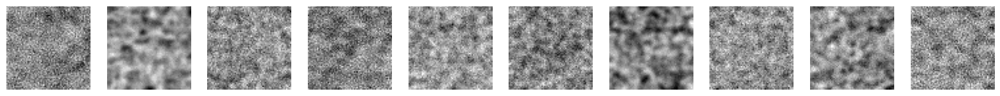

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 795s 159ms/step - n_loss: 0.0415
Epoch 23/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0406
Epoch 23: saving model to ./drive/MyDrive/checkpoint/weights.23.weights.h5

Saved to results/epoch_22.png


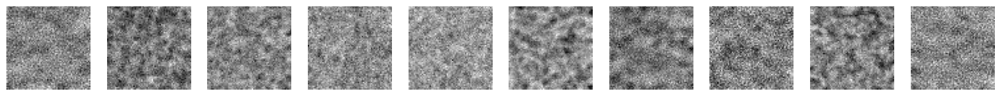

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0406
Epoch 24/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0400
Epoch 24: saving model to ./drive/MyDrive/checkpoint/weights.24.weights.h5

Saved to results/epoch_23.png


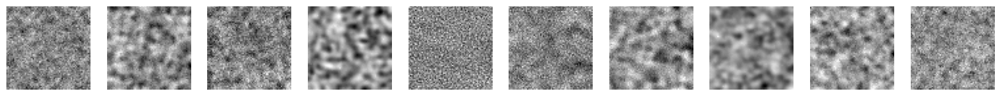

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0400
Epoch 25/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - n_loss: 0.0396
Epoch 25: saving model to ./drive/MyDrive/checkpoint/weights.25.weights.h5

Saved to results/epoch_24.png


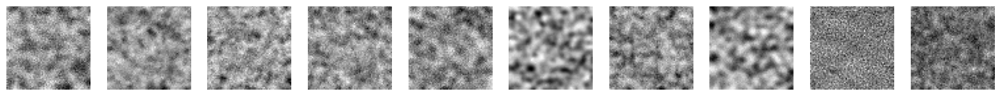

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 796s 159ms/step - n_loss: 0.0396
Epoch 26/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0388
Epoch 26: saving model to ./drive/MyDrive/checkpoint/weights.26.weights.h5

Saved to results/epoch_25.png


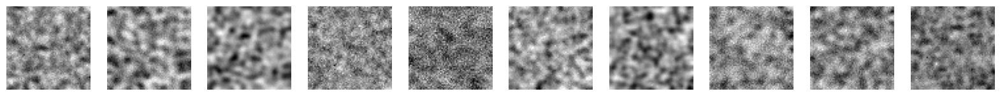

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 793s 159ms/step - n_loss: 0.0388
Epoch 27/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - n_loss: 0.0385
Epoch 27: saving model to ./drive/MyDrive/checkpoint/weights.27.weights.h5

Saved to results/epoch_26.png


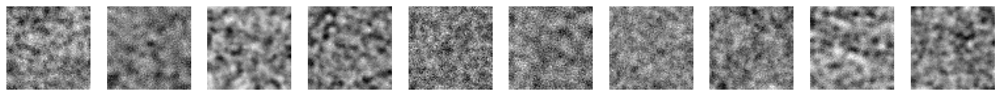

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 797s 159ms/step - n_loss: 0.0385
Epoch 28/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - n_loss: 0.0384
Epoch 28: saving model to ./drive/MyDrive/checkpoint/weights.28.weights.h5

Saved to results/epoch_27.png


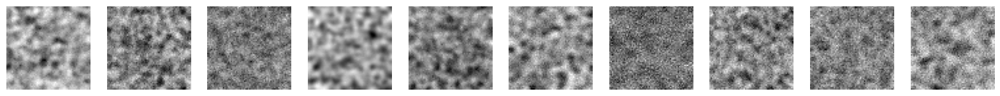

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 796s 159ms/step - n_loss: 0.0384
Epoch 29/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - n_loss: 0.0379
Epoch 29: saving model to ./drive/MyDrive/checkpoint/weights.29.weights.h5

Saved to results/epoch_28.png


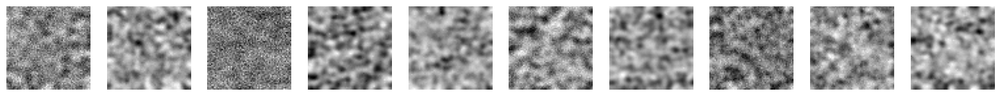

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 796s 159ms/step - n_loss: 0.0379
Epoch 30/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0373
Epoch 30: saving model to ./drive/MyDrive/checkpoint/weights.30.weights.h5

Saved to results/epoch_29.png


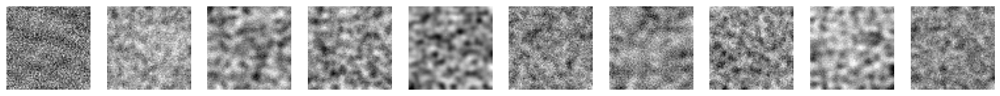

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 792s 158ms/step - n_loss: 0.0373
Epoch 31/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0375
Epoch 31: saving model to ./drive/MyDrive/checkpoint/weights.31.weights.h5

Saved to results/epoch_30.png


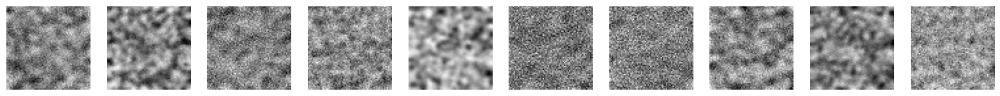

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 795s 159ms/step - n_loss: 0.0375
Epoch 32/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0369
Epoch 32: saving model to ./drive/MyDrive/checkpoint/weights.32.weights.h5

Saved to results/epoch_31.png


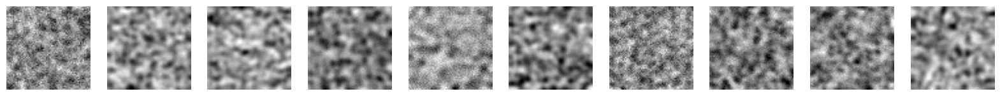

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0369
Epoch 33/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0368
Epoch 33: saving model to ./drive/MyDrive/checkpoint/weights.33.weights.h5

Saved to results/epoch_32.png


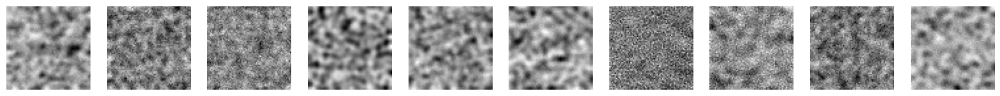

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 795s 159ms/step - n_loss: 0.0368
Epoch 34/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0366
Epoch 34: saving model to ./drive/MyDrive/checkpoint/weights.34.weights.h5

Saved to results/epoch_33.png


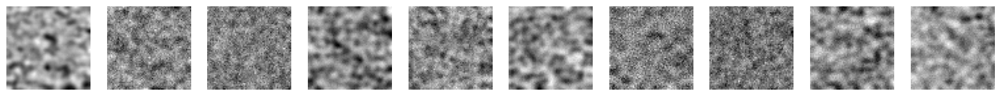

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0366
Epoch 35/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0363
Epoch 35: saving model to ./drive/MyDrive/checkpoint/weights.35.weights.h5

Saved to results/epoch_34.png


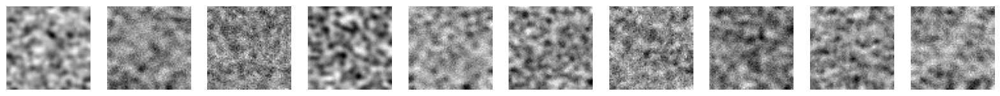

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0363
Epoch 36/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - n_loss: 0.0364
Epoch 36: saving model to ./drive/MyDrive/checkpoint/weights.36.weights.h5

Saved to results/epoch_35.png


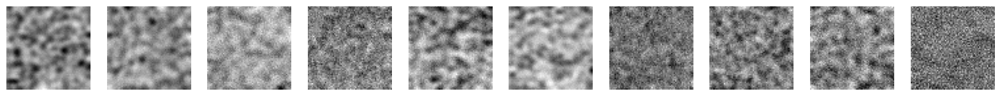

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 795s 159ms/step - n_loss: 0.0364
Epoch 37/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0362
Epoch 37: saving model to ./drive/MyDrive/checkpoint/weights.37.weights.h5

Saved to results/epoch_36.png


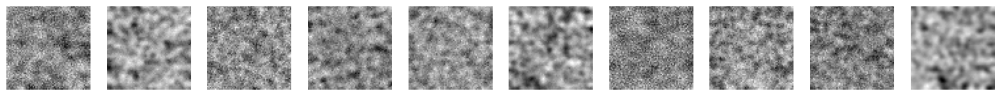

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0362
Epoch 38/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0361
Epoch 38: saving model to ./drive/MyDrive/checkpoint/weights.38.weights.h5

Saved to results/epoch_37.png


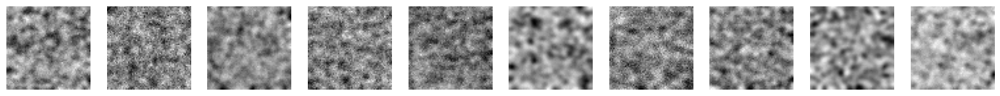

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 795s 159ms/step - n_loss: 0.0361
Epoch 39/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0364
Epoch 39: saving model to ./drive/MyDrive/checkpoint/weights.39.weights.h5

Saved to results/epoch_38.png


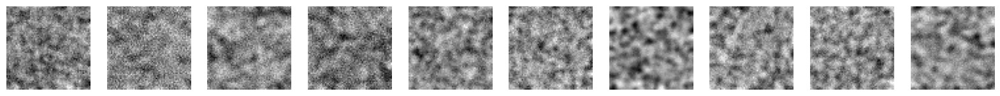

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0364
Epoch 40/40
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - n_loss: 0.0363
Epoch 40: saving model to ./drive/MyDrive/checkpoint/weights.40.weights.h5

Saved to results/epoch_39.png


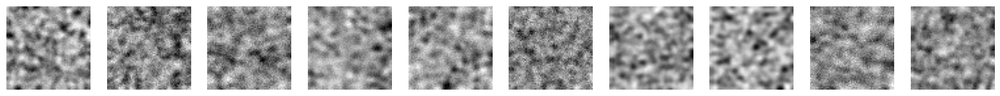

5000/5000 ━━━━━━━━━━━━━━━━━━━━ 794s 159ms/step - n_loss: 0.0363


In [ ]:
ddm.fit(
    train_data,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        image_generator_callback,
    ],
)

In [ ]:
!ls checkpoint

checkpoint.weights.h5


In [16]:
%cd drive

/content/drive


In [17]:
%cd MyDrive

/content/drive/MyDrive


In [18]:
%cd drive/MyDrive/

/content/drive/MyDrive/drive/MyDrive


In [19]:
%cd checkpoint

/content/drive/MyDrive/drive/MyDrive/checkpoint


In [20]:
!ls

weights.01.weights.h5  weights.15.weights.h5  weights.29.weights.h5
weights.02.weights.h5  weights.16.weights.h5  weights.30.weights.h5
weights.03.weights.h5  weights.17.weights.h5  weights.31.weights.h5
weights.04.weights.h5  weights.18.weights.h5  weights.32.weights.h5
weights.05.weights.h5  weights.19.weights.h5  weights.33.weights.h5
weights.06.weights.h5  weights.20.weights.h5  weights.34.weights.h5
weights.07.weights.h5  weights.21.weights.h5  weights.35.weights.h5
weights.08.weights.h5  weights.22.weights.h5  weights.36.weights.h5
weights.09.weights.h5  weights.23.weights.h5  weights.37.weights.h5
weights.10.weights.h5  weights.24.weights.h5  weights.38.weights.h5
weights.11.weights.h5  weights.25.weights.h5  weights.39.weights.h5
weights.12.weights.h5  weights.26.weights.h5  weights.40.weights.h5
weights.13.weights.h5  weights.27.weights.h5
weights.14.weights.h5  weights.28.weights.h5


In [21]:
test_images = np.load("/content/drive/MyDrive/test_dataset.npy")


In [22]:
test_images = np.transpose(test_images, (0, 2, 3, 1))
test_data = tf.data.Dataset.from_tensor_slices(test_images)

In [23]:
if LOAD_MODEL:
    ddm.built = True
    ddm.load_weights("weights.40.weights.h5")

In [24]:
sumi = 0

In [25]:
p = test_images[:250, :, :, 2]
p = p[..., np.newaxis]

In [26]:
noise = tf.random.normal(
  shape=(250, 64, 64, 2)
).numpy()

In [27]:
batch_size = 8
for i in range(1, 41):
    print(f"Step {i}/40")
    tau = i / 40
    tau_matrix = np.full((250, 64, 64, 1), fill_value=tau)
    cur_ = np.concatenate([noise, p, tau_matrix], axis=-1)
    generated_batch_list = []

    for start in range(0, 250, batch_size):
        end = start + batch_size
        batch = cur_[start:end]
        batch_tf = tf.convert_to_tensor(batch, dtype=tf.float32)
        generated_batch = ddm.generate(batch.shape[0], 20, batch_tf)
        generated_batch_list.append(generated_batch.numpy())
    generated_full = np.concatenate(generated_batch_list, axis=0)

    sumi += np.sum(np.abs(generated_full - test_images[(250*(i-1)):(250*i), :, :, :2]))
    print(sumi)


Step 1/40
132116.02993582663
Step 2/40
270741.69061133696
Step 3/40
417052.25125166716
Step 4/40
571358.8046339
Step 5/40
733711.6739057486
Step 6/40
904158.4995177019
Step 7/40
1082695.116769054
Step 8/40
1269029.9109714557
Step 9/40
1462673.668573874
Step 10/40
1663009.5368168345
Step 11/40
1869544.3348740544
Step 12/40
2081898.523644477
Step 13/40
2299787.7035368136
Step 14/40
2522971.074140976
Step 15/40
2750974.9259382896
Step 16/40
2983305.806282968
Step 17/40
3219639.919980789
Step 18/40
3459881.428190329
Step 19/40
3703809.3262196393
Step 20/40
3951446.2655347805
Step 21/40
4202635.188043783
Step 22/40
4456847.669798609
Step 23/40
4713456.453485169
Step 24/40
4971447.570772609
Step 25/40
5229098.803779597
Step 26/40
5483720.6626204485
Step 27/40
5732394.783675263
Step 28/40
5972460.983004353
Step 29/40
6202448.882187137
Step 30/40
6422145.247974711
Step 31/40
6632618.021229731
Step 32/40
6834771.100538015
Step 33/40
7029771.982189914
Step 34/40
7218428.771218223
Step 35/40
7401

In [29]:
print(sumi / 10000 / 64 / 64 / 2)

0.10084299516805692
